<div class="header" id="Inhoud">Inhoud<a class="anchor-link" href="#Inhoud"></a></div>

1. [Context](#Context)
1. [Libraries](#Libraries)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)

<div class="header" id="Context">Context<a class="anchor-link" href="#Context"></a></div>

<div class='smallheader'>Waarom deze opdracht?<div>

<div class="header" id="Libraries">Libraries<a class="anchor-link" href="#Libraries"></a></div>

<div class='smallheader'>Installatie van libraries<div>

In [2]:
'''
!pip install opencv-python
!pip install dask
!pip install imageio
!pip install torch
!pip install albumentations --user
!pip install torchvision
!pip install termcolor
!pip install matplotlib
!pip install pandas
!pip install plotly
!pip install seaborn
!pip install ipywidgets'
'''

"\n!pip install opencv-python\n!pip install dask\n!pip install imageio\n!pip install torch\n!pip install albumentations --user\n!pip install torchvision\n!pip install termcolor\n!pip install matplotlib\n!pip install pandas\n!pip install plotly\n!pip install seaborn\n!pip install ipywidgets'\n"

In [3]:
'''
%%capture
!pip install ../segmentation-models-wheels/efficientnet_pytorch-0.6.3-py3-none-any.whl
!pip install ../segmentation-models-wheels/pretrainedmodels-0.7.4-py3-none-any.whl
!pip install ../segmentation-models-wheels/timm-0.3.2-py3-none-any.whl
!pip install ../segmentation-models-wheels/segmentation_models_pytorch-0.1.3-py3-none-any.whl
'''

'\n%%capture\n!pip install ../segmentation-models-wheels/efficientnet_pytorch-0.6.3-py3-none-any.whl\n!pip install ../segmentation-models-wheels/pretrainedmodels-0.7.4-py3-none-any.whl\n!pip install ../segmentation-models-wheels/timm-0.3.2-py3-none-any.whl\n!pip install ../segmentation-models-wheels/segmentation_models_pytorch-0.1.3-py3-none-any.whl\n'

In [1]:
import gc
import os
import pdb
import time
import glob
import sys
import cv2
import imageio
#import joblib
import math
import random
import math

import numpy as np
import pandas as pd

import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.patches as patches

plt.rcParams.update({'font.size': 18})
plt.style.use('fivethirtyeight')

import seaborn as sns
import matplotlib
from dask import bag, diagnostics 
from mpl_toolkits.mplot3d import Axes3D

from termcolor import colored

from tqdm.notebook import tqdm

# import timm
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import torch.backends.cudnn as cudnn
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Dataset, sampler

from sklearn.model_selection import KFold

from albumentations import (HorizontalFlip, VerticalFlip, 
                            ShiftScaleRotate, Normalize, Resize, 
                            Compose, GaussNoise)
from albumentations.pytorch import ToTensorV2

import warnings
warnings.simplefilter('ignore')

# Activate pandas progress apply bar
tqdm.pandas()

## Global configuration

Definiëren van de paths van alle benodigde componenten.

In [2]:
DIRECTORY_PATH = "sartorius-cell-instance-segmentation"
TRAIN_CSV = DIRECTORY_PATH + "/train.csv"
TRAIN_PATH = DIRECTORY_PATH + "/train"
TEST_PATH = DIRECTORY_PATH + "/test"
TRAIN_SEMI_SUPERVISED_PATH = DIRECTORY_PATH + "/train_semi_supervised"
    
SEED = 42
    
RESNET_MEAN = (0.485, 0.456, 0.406)
RESNET_STD = (0.229, 0.224, 0.225)
    
# (336, 336)
IMAGE_RESIZE = (224, 224)
    
LEARNING_RATE = 5e-4
EPOCHS = 1

## Data sets inladen

### Data dictionary ###

| Variabele | Omschrijving | Datatype | Numeriek of Categorie | Meetniveau |
| :--- | :--- | :--- | :--- | :--- |
| Id | Een unieke identificatie code | Integer | Nummeriek | Ordinaal |
| annotation | gecodeerde pixels van een geïdentificeerde neuronen cell | Object | Nummeriek | Ordinaal |
| width | breedte van de source image | Integer | Nummeriek | Interval |
| height | hoogte van de source image | Integer | Nummeriek | Interval |
| cell_type | Type van de cell | String | Catagorie | Nominaal |
| plate_time | Tijd van het maken van de sample | Time | Nummeriek | Interval |
| sample_date | Datum wanneer de sample is gemaakt | Date | Nummeriek | Interval |
| sample_id | Een unieke identificatie code van de sample | Integer | Catagorie | Ordinaal |
| elepased_timedelta | Tijd sinds eerste image is genomen | Date | Nummeriek | Ratio |

### Cell types ###

| Cell type | Volledige naam | Omschrijving |
| :--- | :--- | :--- |
| shsy5y | SH-SY5Y / Neuroglioblastome | Een cell lijn afgestamd van beenmerg |
| astro | Astrocytes  | Een subtype van Glial cellen in het centrale zenuwstelsel |
| cort | Neuronen / cerebral cortex | Neuronen in de hersenschors |

In [3]:
df_train = pd.read_csv(TRAIN_CSV)

In [4]:
def getImagePaths(path):
    """
    Function to Combine Directory Path with individual Image Paths
    
    parameters: path(string) - Path of directory
    returns: image_names(string) - Full Image Path
    """
    image_names = []
    for dirname, _, filenames in os.walk(path):
        for filename in tqdm(filenames):
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

In [5]:
train_images_path = getImagePaths(TRAIN_PATH)
test_images_path = getImagePaths(TEST_PATH)
train_semi_supervised_path = getImagePaths(TRAIN_SEMI_SUPERVISED_PATH)

  0%|          | 0/606 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1972 [00:00<?, ?it/s]

# Verkennende analyse

### Train data head

In [9]:
df_train.head()

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


### Train data info

In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73585 entries, 0 to 73584
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 73585 non-null  object
 1   annotation         73585 non-null  object
 2   width              73585 non-null  int64 
 3   height             73585 non-null  int64 
 4   cell_type          73585 non-null  object
 5   plate_time         73585 non-null  object
 6   sample_date        73585 non-null  object
 7   sample_id          73585 non-null  object
 8   elapsed_timedelta  73585 non-null  object
dtypes: int64(2), object(7)
memory usage: 5.1+ MB


### Train data grote

In [7]:
print(f"Training Dataset Shape: {colored(df_train.shape, 'red')}")

Training Dataset Shape: (73585, 9)


### Unieke waardes per kolom

In [12]:
for col in df_train.columns:
    print(col + ":" + colored(str(len(df_train[col].unique())), 'red'))

id:606
annotation:73470
width:1
height:1
cell_type:3
plate_time:8
sample_date:18
sample_id:403
elapsed_timedelta:8


### Aantal images per directory

In [13]:
print(f"Number of train images: {colored(len(train_images_path), 'red')}")
print(f"Number of test images:  {colored(len(test_images_path), 'red')}")

Number of train images: 606
Number of test images:  3


## Distributie plots

In [14]:
def plot_distribution(x):

    fig = px.histogram(
    df_train, 
    x = x,
    width = 800,
    height = 500,
    )
    
    fig.show()

In [15]:
plot_distribution('cell_type')

In [16]:
plot_distribution('plate_time')

In [17]:
plot_distribution('elapsed_timedelta')

## Image view

In [18]:
def display_multiple_img(images_paths, rows, cols):
    """
    Function to Display Images from Dataset.
    
    parameters: images_path(string) - Paths of Images to be displayed
                rows(int) - No. of Rows in Output
                cols(int) - No. of Columns in Output
    """
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    for ind,image_path in enumerate(images_paths):
        image=cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()

### Training images

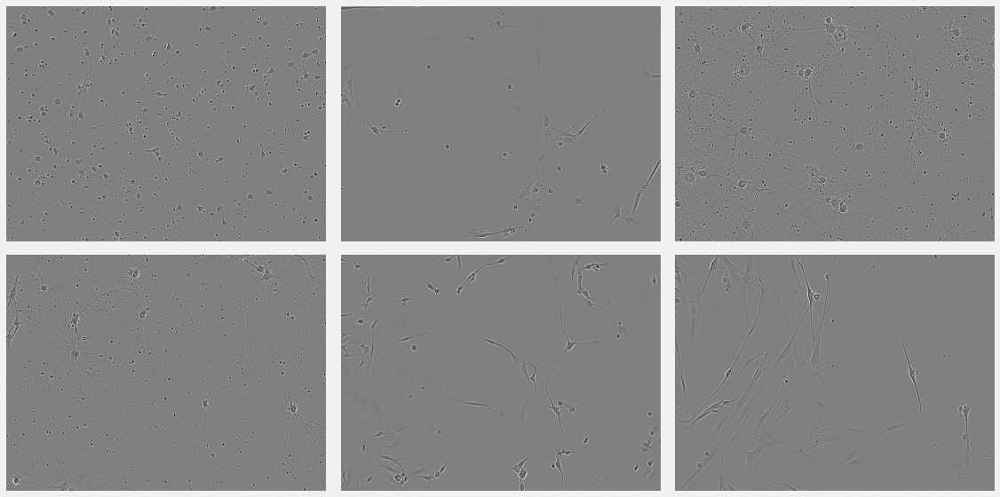

In [19]:
display_multiple_img(train_images_path[100:150], 2, 3)

### Training Semi Supervised Images

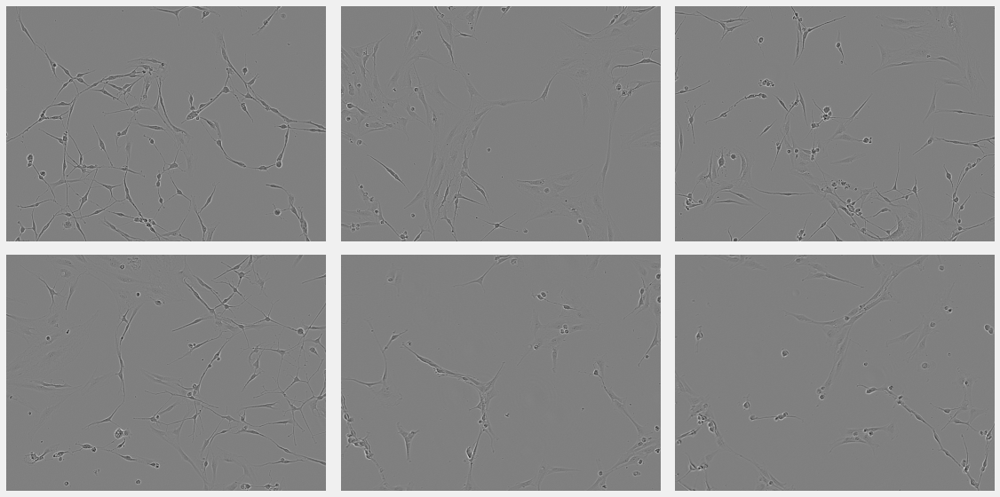

In [20]:
display_multiple_img(train_semi_supervised_path[100:150], 2, 3)

### Test Images

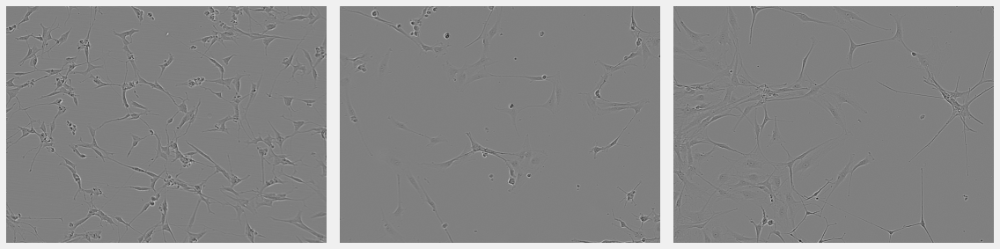

In [21]:
display_multiple_img(test_images_path, 1, 3)

## Mask plots

In [22]:
def rle_decode(mask_rle, shape, color=1):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height, width, channels) of array to return 
    color: color for the mask
    Returns numpy array (mask)

    '''
    s = mask_rle.split()
    
    starts = list(map(lambda x: int(x) - 1, s[0::2]))
    lengths = list(map(int, s[1::2]))
    ends = [x + y for x, y in zip(starts, lengths)]
    
    img = np.zeros((shape[0] * shape[1], shape[2]), dtype=np.float32)
            
    for start, end in zip(starts, ends):
        img[start : end] = color
    
    return img.reshape(shape)

def build_masks(df_train, image_id, input_shape):
    height, width = input_shape
    labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
    mask = np.zeros((height, width))
    for label in labels:
        mask += rle_decode(label, shape=(height, width))
    mask = mask.clip(0, 1)
    return mask

def plot_masks(image_id, colors=True):
    labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
    cell_type = df_train[df_train["id"] == image_id]["cell_type"].tolist()
    cmap = {"shsy5y":(0,0,255),"astro":(0,255,0),"cort":(255,0,0)}

    if colors:
        mask = np.zeros((520, 704, 3))
        for label,cell_type in zip(labels,cell_type):
            c = cmap[cell_type]
            mask += rle_decode(label, shape=(520, 704, 3), color=c)
    else:
        mask = np.zeros((520, 704, 1))
        for label in labels:
            mask += rle_decode(label, shape=(520, 704, 1))
    mask = mask.clip(0, 1)

    image = cv2.imread(f"sartorius-cell-instance-segmentation/train/{image_id}.png")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16, 32))
    plt.subplot(3, 1, 1)
    plt.imshow(image)
    plt.axis("off")
    plt.subplot(3, 1, 2)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)
    plt.axis("off")
    plt.subplot(3, 1, 3)
    plt.imshow(mask)
    plt.axis("off")
    
    plt.show();

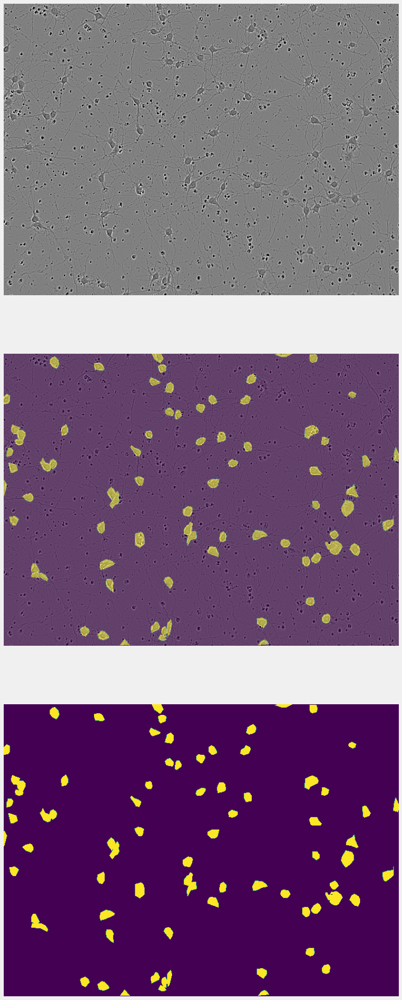

In [23]:
plot_masks("ffdb3cc02eef", colors=False)

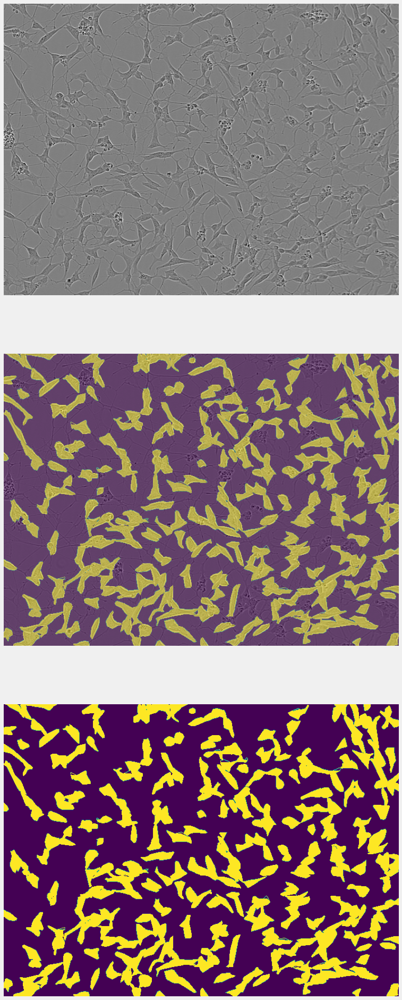

In [24]:
plot_masks("0030fd0e6378", colors=False)

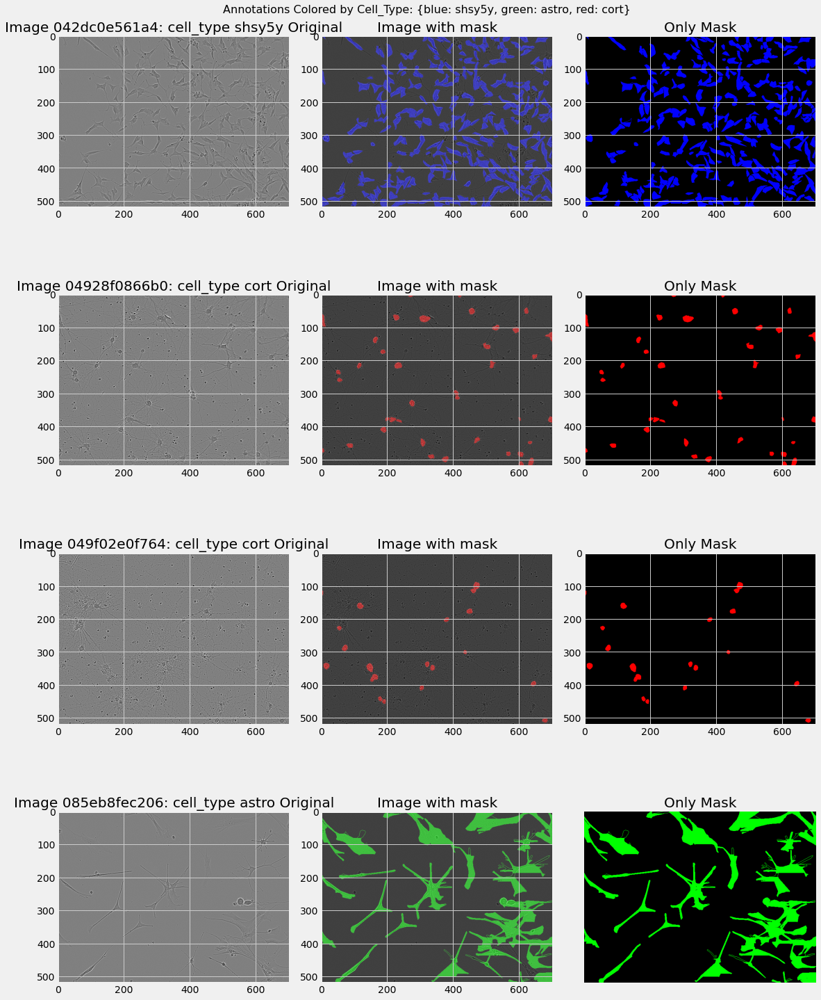

In [25]:
def plot_masks_all(image_ids, colors=True):
    fig, ax = plt.subplots(len(image_ids),3,figsize=(16, 21))
    for idx,image_id in enumerate(image_ids):
        labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
        cell_type = df_train[df_train["id"] == image_id]["cell_type"].tolist()
        cmap = {"shsy5y":(0,0,255),"astro":(0,255,0),"cort":(255,0,0)}

        if colors:
            mask = np.zeros((520, 704, 3))
            for label,cell_t in zip(labels,cell_type):
                c = cmap[cell_t]
                mask += rle_decode(label, shape=(520, 704, 3), color=c)
        else:
            mask = np.zeros((520, 704, 1))
            for label in labels:
                mask += rle_decode(label, shape=(520, 704, 1))
        mask = mask.clip(0, 1)

        image = cv2.imread(f"sartorius-cell-instance-segmentation/train/{image_id}.png")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ax[idx,0].imshow(image)
        ax[idx,0].set_title(f"Image {image_id}: cell_type {cell_t} Original")
        plt.axis("off")
        
        ax[idx,1].imshow(image)
        ax[idx,1].imshow(mask, alpha=0.5)
        ax[idx,1].set_title(f"Image with mask")
        plt.axis("off")
        
        ax[idx,2].imshow(mask)
        ax[idx,2].set_title(f"Only Mask")
        plt.axis("off")
    plt.tight_layout()
    fig.suptitle("Annotations Colored by Cell_Type: {blue: shsy5y, green: astro, red: cort}",fontsize=16)
    plt.show();

plot_masks_all(['042dc0e561a4', '04928f0866b0', '049f02e0f764', '085eb8fec206'])

In [26]:
df_train.id.unique()

array(['0030fd0e6378', '0140b3c8f445', '01ae5a43a2ab', '026b3c2c4b32',
       '029e5b3b89c7', '0323e81d23d9', '03b27b381a5f', '042c17cd9143',
       '042dc0e561a4', '04928f0866b0', '049f02e0f764', '04cd81dfb245',
       '053d61766edb', '05c61f0f46b7', '061b49d7dbbb', '06c5740c8b18',
       '0728b8f39241', '07e9ba109e34', '083b178bb184', '085eb8fec206',
       '08f52aa2add3', '097d60b2cf71', '0a6ecc5fe78a', '0ba181d412da',
       '0c5938ac5e3c', '0c90b86742b2', '0cfdeeb0dded', '0df9d6419078',
       '0e1e2b68fa58', '0e9b40b10de8', '0ea6df67cc77', '0eb1d03df587',
       '0eca9ecf4987', '0f08d640930b', '0f2a46026693', '0f7d009bc5d3',
       '100681b6cc7a', '115fad550598', '11c136be56b7', '11c2e4fcac6d',
       '1242e4ec6ef3', '129f894abe35', '13325f865bb0', '1395c3f12b7c',
       '144a7a69f67d', '14dbd973a7cd', '15283b194621', '152bcf26456b',
       '15aeb12e7a83', '16e538bbe8c5', '172334437c88', '174793807517',
       '17754cb5b287', '17d738f88487', '182c3da676bd', '1874b96fd317',
      

In [6]:
def decode_rle_to_mask(rle, height, width, color, viz=False):
    rle = np.array(rle.split(' ')).reshape(-1, 2)
    mask = np.zeros((height*width, 1, 3))
    if viz:
        color = np.random.rand(3)
    else:
        color = color
    for i in rle:
        mask[int(i[0]):int(i[0])+int(i[1]), :, :] = color

    return mask.reshape(height, width, 3)

(520, 704, 3)
This is the image we are going to use, id:- 0030fd0e6378


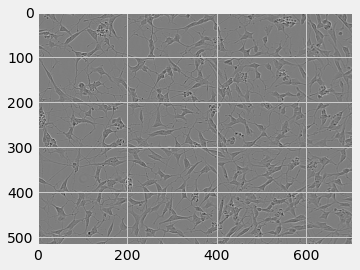

In [28]:
example_id = '0030fd0e6378' # change the example id for different images
image = cv2.imread(os.path.join(TRAIN_PATH, example_id)+'.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = (image-np.min(image))/(np.max(image)-np.min(image))
print(image.shape)
print("This is the image we are going to use, id:-", example_id)
plt.imshow(image)
plt.show()

The Annotation :  118145 6 118849 7 119553 8 120257 8 120961 9 121665 10 122369 12 123074 13 123778 14 124482 15 125186 16 125890 17 126594 18 127298 19 128002 20 128706 21 129410 22 130114 23 130818 24 131523 24 132227 25 132931 25 133635 24 134339 24 135043 23 135748 21 136452 19 137157 16 137864 11 138573 4
Now let's convert it to mask and view it


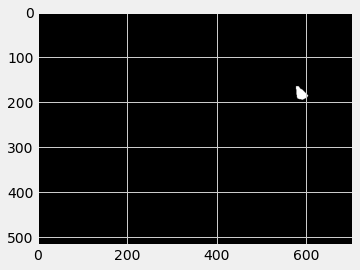

In [29]:
example_annot = df_train[df_train.id==example_id].annotation.values[0]
print("The Annotation : ",example_annot)
print("Now let's convert it to mask and view it")
mask = decode_rle_to_mask(example_annot, image.shape[0], image.shape[1], [1,1,1], viz=False)
plt.imshow(mask)
plt.show()

# TESTING ANNOTATION MAKING

(520, 704, 3)
This is the image we are going to use, id:- 0030fd0e6378


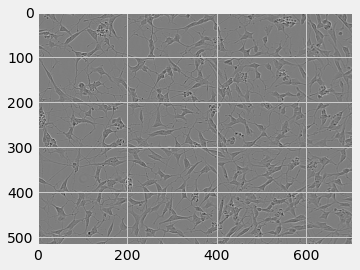

In [30]:
example_id = '0030fd0e6378' # change the example id for different images
image = cv2.imread(os.path.join(TRAIN_PATH, example_id)+'.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = (image-np.min(image))/(np.max(image)-np.min(image))
print(image.shape)
print("This is the image we are going to use, id:-", example_id)
plt.imshow(image)
plt.show()

In [31]:
from PIL import Image, ImageEnhance

In [32]:
def getimage(idtje):
    image = cv2.imread(os.path.join(TRAIN_PATH, idtje)+'.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [33]:
def enhancetest(image):
    image = np.asarray(ImageEnhance.Contrast(Image.fromarray(image)).enhance(16))
    #image = (image-np.min(image))/(np.max(image)-np.min(image))
    return image

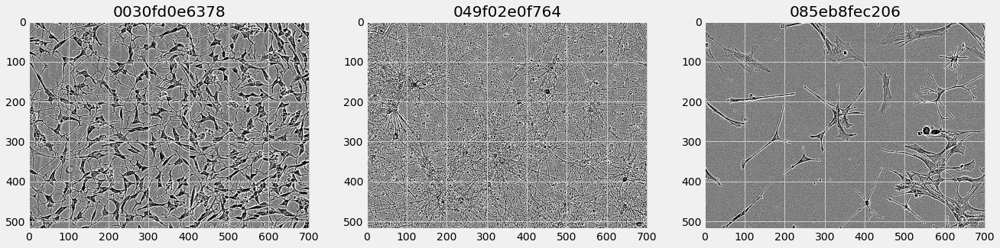

In [34]:
fig, ax = plt.subplots(1, 3)
fig.set_size_inches(20, 20)

images = ['0030fd0e6378', '049f02e0f764', '085eb8fec206']
plot = 0

for i in images:
    ax[plot].imshow(enhancetest(getimage(i)))
    ax[plot].set_title(i)
    plot+=1

# orginal image

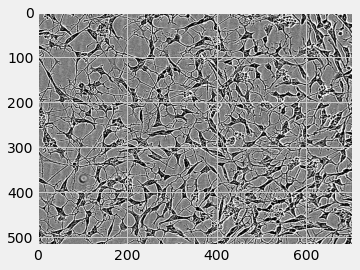

In [35]:
test = enhancetest(getimage('0030fd0e6378'))
plt.imshow(test)
plt.show()

# threshholding

In [36]:
#test = cv2.cvtColor(test, cv2.COLOR_BGR2GRAY)
#ret,th1 = cv2.threshold(test,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(test,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
#th3 = cv2.adaptiveThreshold(test,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)


error: OpenCV(4.6.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\thresh.cpp:1674: error: (-215:Assertion failed) src.type() == CV_8UC1 in function 'cv::adaptiveThreshold'


In [ ]:
images = [test, th1, th2, th3]

fig, ax = plt.subplots(4, 1)
fig.set_size_inches(20, 20)

for i in range(4):
    ax[i].imshow(images[i], cmap='gray')

plt.show()

In [ ]:
green = np.uint8([[[0, 0, 153]]]) #here insert the bgr values which you want to convert to hsv
hsvGreen = cv2.cvtColor(green, cv2.COLOR_BGR2HSV)
print(hsvGreen)

lowerLimit = hsvGreen[0][0][0] - 10, 100, 100
upperLimit = hsvGreen[0][0][0] + 10, 255, 255

print(upperLimit)
print(lowerLimit)

In [ ]:
rgb = cv2.cvtColor(test, cv2.COLOR_GRAY2BGR)
hsv = cv2.cvtColor(rgb, cv2.COLOR_BGR2HSV)




plt.imshow(hsv)
plt.show()

In [ ]:
lower = np.array([0,  0, 254])
upper = np.array([1, 1, 255])

mask = cv2.inRange(hsv, lower, upper)

output = cv2.bitwise_and(hsv,hsv, mask= mask)

plt.imshow(output)
plt.show()

In [ ]:
rgb = cv2.cvtColor(test, cv2.COLOR_GRAY2BGR)
hsv = cv2.cvtColor(rgb, cv2.COLOR_BGR2HSV)

lower_val = np.array([0,0,170])
upper_val = np.array([0,2,255])

mask = cv2.inRange(hsv, lower_val, upper_val)

only_green = cv2.bitwise_and(test,test, mask= mask)


plt.imshow(only_green)
plt.show()

# canny edge detection

In [ ]:
edges = cv2.Canny(image=test, threshold1=1000, threshold2=1529) 
plt.imshow(edges, cmap='gray')

In [ ]:
plt.imshow(test)
plt.imshow(edges, alpha=0.5)

# validatie

In [ ]:
example_id_annotations = df_train[df_train.id=='0030fd0e6378'].annotation.values
masks = np.zeros(image.shape)
for each_cell_annot in example_id_annotations:
    mask = decode_rle_to_mask(each_cell_annot, image.shape[0], image.shape[1], [1,1,1], viz=False)
    masks+=mask
t = image+masks
       
#plt.imshow(image)
plt.imshow(masks)
#plt.imshow(t)
plt.show()

In [ ]:
plt.imshow(edges)

In [ ]:
plt.imshow(test)
plt.imshow(output, alpha=0.5)

In [ ]:
plt.imshow(masks)
plt.imshow(output, alpha=0.5)

In [ ]:
plt.imshow(output, cmap='gray')

# create all masks

In [7]:
df_train

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
...,...,...,...,...,...,...,...,...,...
73580,ffdb3cc02eef,3610 3 4311 7 5014 9 5717 11 6420 13 7123 15 7...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73581,ffdb3cc02eef,341585 2 342287 5 342988 10 343690 13 344394 1...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73582,ffdb3cc02eef,47788 3 48490 7 49192 11 49896 13 50599 14 513...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73583,ffdb3cc02eef,333290 1 333993 2 334696 4 335399 5 336102 6 3...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00


# Liam stuff

In [367]:
def score_berekenen(masks, image_array):
    getal = 519
    getal2 = 703
    i=0
    j=0
    resultaten = []
    #
    while i <= getal:
        while j <= getal2:
            m = tf.keras.metrics.MeanIoU(num_classes=2)
            if masks[i][j][0] == 2.0:
                masks[i][j] = [1., 1., 1.]
            m.update_state(masks[i][j], image_array[i][j])
            resultaten.append(m.result().numpy())
            j = j +1
        i = i + 1
    return resultaten

In [368]:
def mask_maken(row_indexes,col_indexes):
    #inlezen 1 waardes voor de mask
    array = []
    tel = 0
    predict_mask = []
    for i in row_indexes:
        predict_mask.append(i)
        predict_mask.append(col_indexes[tel])
        tel = tel + 1
    # aanmaken array met juiste aantal rijen
    image_array= []
    a = []
    groote = 519
    i = 0
    while i <= 519:
        a = []
        image_array.append(a)
        i = i +1
    # aanmaken array met juiste aantal kolomen
    i = 0
    while i <= 519:
        o = 0
        while o <= 703:
            a = []
            image_array[i].append(a)
            o = o+1
        i = i +1
    # vullen array
    for i in image_array:
        for r in i:
                r.append(0.)
                r.append(0.)
                r.append(0.)
    # toevoegen mask aan array
    getal = 519
    i= 0
    lengte = len(predict_mask)
    lengte = lengte - 1
    while i <= lengte:
        rij = predict_mask[i]
        kolom = predict_mask[i+1]
        image_array[rij][kolom].clear()
        image_array[rij][kolom].append(1.)
        image_array[rij][kolom].append(1.)
        image_array[rij][kolom].append(1.)
        i = i + 2
    return image_array

In [387]:
i = 0
nummer = 1
scores = []
for foto in os.listdir(TRAIN_PATH):
    img = cv2.imread(TRAIN_PATH + "\\" + foto,0)
    edges = cv2.Canny(img,100,200)
    row_indexes, col_indexes = np.nonzero(edges)
    # dit weghalen als alle foto's gedaan moeten worden
    if i <= 4:
        voorspel_mask = mask_maken(row_indexes,col_indexes)
        resultaten = score_berekenen(masks_dict[foto.replace(".png","")], masks_dict[foto.replace(".png","")])
        score = sum(resultaten)/(519*703)
        scores.append(score)
        i = i + 1
        nummer = nummer + 1
print(scores)

[0.0019295230734232864, 0.0019295230734232864, 0.0019295230734232864, 0.0019295230734232864, 0.0019295230734232864]


# old code

In [14]:
def compare_annotations(masks_dict): 
    # Create tqdm progress bar
    bar_loop_keys = tqdm(masks_dict.keys())
    score_dict = {}

    # For every key in dict 
    for key in bar_loop_keys:
        bar_loop_keys.set_description("Calculating Score: %s" % key)

        # Get images from key
        key_image = getimage(key)

        # Apply canny edge detection
        edges = canny_edge(key_image)

        # Define indexes
        row_indexes, col_indexes = np.nonzero(edges)

        # Create prediction mask
        predict_mask = create_new_mask(row_indexes,col_indexes)

        # Calculate IoU
        results = calculate_score(masks_dict[key], predict_mask)

        # Summarize results
        score = sum(results)/(519*703)

        score_dict[key] = score
        
    return score_dict

In [160]:
def calculate_score(masks, image_array):
    
    number = [519, 703]
    # Height / Width
    h, w = 0,0 
    results = []
    
    # Calculate IoU for every pixel
    while h <= number[0]:
        while w <= number[1]:
            m = tf.keras.metrics.MeanIoU(num_classes=2)
            
            if masks[h][w][0] == 2.0:
                masks[h][w] = [1., 1., 1.]
                
            m.update_state(masks[h][w], image_array[h][w])
            results.append(m.result().numpy())
            
            w+=1
        h+=1
        
    # Summarize results
    score = sum(results)/(519*703)
    
    return score

In [239]:
def create_new_mask_old(row_indexes,col_indexes):
    
    predict_mask = []
    
    index_number = 0
    height = 520
    width = 704
    
    # Create mask from row index
    for pixel in row_indexes:
        predict_mask.append(pixel)
        predict_mask.append(col_indexes[index_number])
        index_number+=1
    
    # Create empty array
    image_array = [[[] for i in range(704)] for j in range(520)]
    
    # Fill the array
    for i in image_array:
        for r in i:
            r.extend([0.,0.,0.])
    
    # Add mask to array
    i = 0
    while i <= len(predict_mask) - 2:
        image_array[predict_mask[i]][predict_mask[i+1]].clear()
        image_array[predict_mask[i]][predict_mask[i+1]].extend([1.,1.,1.])
        i+=2
    
    return image_array

# Danny stuff + dikke nieuwe code

In [7]:
import tensorflow as tf

In [8]:
def decode_rle_to_mask(rle, height, width, color, viz=False):
    rle = np.array(rle.split(' ')).reshape(-1, 2)
    mask = np.zeros((height*width, 1, 3))
    if viz:
        color = np.random.rand(3)
    else:
        color = color
    for i in rle:
        mask[int(i[0]):int(i[0])+int(i[1]), :, :] = color

    return mask.reshape(height, width, 3)

In [9]:
def create_masks(source, unique_number = None):
    
    # unique_number : specifies number of unique ids to get
    # source : specifies the source variable (dataframe)
    
    masks_dict = {}

    if unique_number == None:
        unique_id = source['id'].unique()
    else:
        unique_id = source['id'].unique()[:unique_number]
        
    # Create tqdm progress bar
    bar_loop = tqdm(unique_id)
    
    # For every unique id in the data set 
    for image_id in bar_loop:
        bar_loop.set_description("Processing Mask: %s" % image_id)
        
        # Create base mask
        ground_mask = np.zeros(np.array([520, 704, 3]))

        # For each separate annotation / row
        for each_cell_annot in source[source.id==image_id].annotation.values:
            
            # Decode annotation and create mask
            mask = decode_rle_to_mask(each_cell_annot, 520, 704, 1)
            
            # Add mask to starting mask
            ground_mask+=mask
        
        # Add completed mask to dictionary
        masks_dict[image_id] = ground_mask
        
    return masks_dict

In [10]:
def getimage(image_id):
    image = cv2.imread(os.path.join(TRAIN_PATH, image_id)+'.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [11]:
def canny_edge(image):
    edges = cv2.Canny(image,100,200)
    return edges

In [12]:
def create_alter_mask(altered_images):
    
    # Define indexes
    row_indexes, col_indexes = np.nonzero(altered_images)[0:2]
    
    # Create prediction mask
    predict_mask = create_new_mask(row_indexes,col_indexes)
    
    return predict_mask

In [13]:
def create_new_mask(row_indexes,col_indexes):
    
    predict_mask = []
    index = 0
    
    # Create mask from row index
    for pixel in row_indexes:
        predict_mask.append(pixel)
        predict_mask.append(col_indexes[index])
        index+=1
    
    # Create empty numpy array
    image_array = np.zeros((520, 704, 3), dtype=float)
    
    # Add mask to array
    for i in range(0, len(predict_mask), 2):
        row, col = predict_mask[i], predict_mask[i+1]
        image_array[row][col] = [1., 1., 1.]
    
    return image_array

In [14]:
def image_altering(data, alter_function):
    
    key_image = {}
    altered_images = {}
    
    # Get images from key (dict or list)
    if type(data) == dict:
        for k in data.keys():
            key_image[k] = getimage(k)
    elif type(data) == list:
        for k in data:
            key_image[k] = getimage(k)
    else:
        print('Data needs to be Dict or List')
    
    # Create tqdm progress bar
    bar_loop_data = tqdm(key_image)
    
    for k in bar_loop_data:
        bar_loop_data.set_description("Converting Image: %s" % k)
    
        # image processing techinique used to alter image (must be function)
        altered_images[k] = alter_function(key_image[k])
        
    return altered_images

In [15]:
def calculate_iou(ground_truth, prediction):
    
    # Calculate intersection
    intersection = np.logical_and(prediction, ground_truth).sum()
    
    # Calculate union
    union = np.logical_or(prediction, ground_truth).sum()
    
    # Calculate IoU
    iou = intersection / union
    
    return iou

In [202]:
def proces_scores(scores_dict):
    
    # Add cell type and score to each id
    scores_dict = {
        key: {
            'Score': score, 
            'Cell_type': df_train.cell_type.loc[df_train['id'] == key].unique()[0]
        } for key, score in scores_dict.items() }
    
    # Get unique cell types
    cell_types = set(score["Cell_type"] for score in scores_dict.values())
    
    # Create a dictionary with average score of each cell_type
    scores = {
        cell_type: 
            sum(score['Score'] for score in scores_dict.values() if score['Cell_type'] == cell_type)
            / len([score for score in scores_dict.values() if score['Cell_type'] == cell_type])
        for cell_type in cell_types }
    
    # Calculate total average score
    scores["total"] = sum(score['Score'] for score in scores_dict.values())/len(scores_dict)
    
    return scores

In [203]:
def compare_masks(masks_dict, altered_images): 
    
    # Create tqdm progress bar
    bar_loop_keys = tqdm(altered_images)
    score_dict = {}

    # For every key in dict 
    for key in bar_loop_keys:
        bar_loop_keys.set_description("Calculating Score:\t %s" % key)

        # Create prediction mask
        predict_mask = np.array(create_alter_mask(altered_images[key]))

        # Calculate IoU
        score = calculate_iou(masks_dict[key], predict_mask)

        score_dict[key] = score
        
    score_dict = proces_scores(score_dict)
        
    return score_dict

In [201]:
# variables: df source and optional number of unique ids (default = all)
masks_dict = create_masks(df_train, 10)

# Alter images with image processing techniques (variable dict or list with Ids and image altering function)
altered_images = image_altering(masks_dict, canny_edge)

# Compare original mask and created mask
dikkedict = compare_masks(masks_dict, altered_images)

for k, v in dikkedict.items():
    print(f"{k}\t: {v}")

#print(f"\nAverage Score: {sum(dikkedict.values()) / len(dikkedict)}")

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

shsy5y	: 0.2039195965949764
cort	: 0.06743769982992893
astro	: 0.16562701408710065
total	: 0.11820120028516035


Average Score for 10 values: 0.11820120028516035

Average Score for 50 values: 0.11669348652173098

Average Score for 100 values: 0.12119333424153587

Average Score for 606 values: 0.11607818933776831

## mask / altered example

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


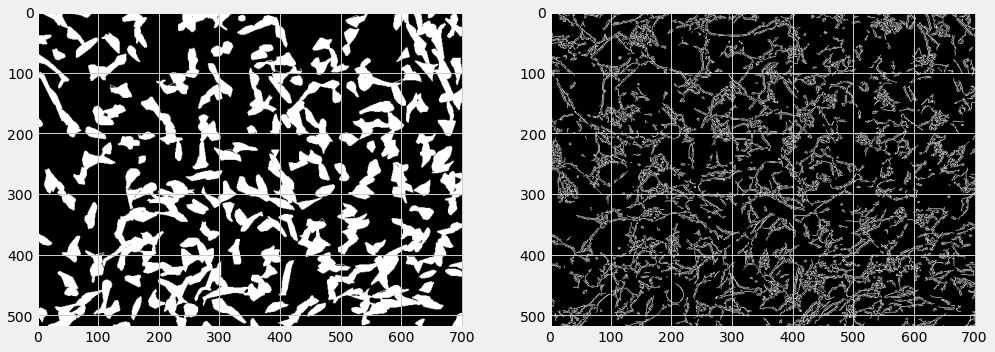

In [22]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(15, 15)

# Get first key
#key = list(masks_dict.keys())[4]
key = '0030fd0e6378'
images = [masks_dict[key], altered_images[key]]
plot = 0

for key in images:
    ax[plot].imshow(key, cmap='gray')
    #ax[plot].set_title(f'{key}')
    plot+=1

## Testing

In [186]:
score_dict = dikkedict.copy()
score_dict

{'0030fd0e6378': 0.20733611822720735,
 '0140b3c8f445': 0.16562701408710065,
 '01ae5a43a2ab': 0.08548414304993253,
 '026b3c2c4b32': 0.05630106757320928,
 '029e5b3b89c7': 0.112205377890893,
 '0323e81d23d9': 0.06762776139168121,
 '03b27b381a5f': 0.012638563416624978,
 '042c17cd9143': 0.2082670222375156,
 '042dc0e561a4': 0.1961556493202063,
 '04928f0866b0': 0.07036928565723262}

In [175]:
def proces_scores(scores_dict):
    
    scores = {'shsy5y': [],'cort': [],'astro': []}
    total_scores = {'shsy5y':'','cort':'','astro':'', 'total':''}
    
    # Get total average scores
    total_scores['total'] = sum(scores_dict.values())/len(scores_dict)
    
    # Create new key with cell types
    for key,score in scores_dict.items():
        cell_type = df_train.cell_type.loc[df_train['id'] == key].unique()[0]
        scores_dict[key] = {'Score':score, 'Cell_type':cell_type}
    
    # Fill lists with cell type scores
    for k, v in scores_dict.items():
        scores[v['Cell_type']].append(v['Score'])
       
    # Get averages from list and put in Dict
    for cell_type, score_list in scores.items():
        avg_score = sum(score_list) / len(score_list)
        total_scores[cell_type] = avg_score
        
    return total_scores

In [189]:
def proces_scores(scores_dict):
    
    # Add cell type and score to each id
    scores_dict = {key: {'Score': score, 'Cell_type': df_train.cell_type.loc[df_train['id'] == key].unique()[0]} for key, score in scores_dict.items()}
    
    # Get unique cell types
    cell_types = set(score["Cell_type"] for score in scores_dict.values())
    
    # Create a dictionary with average score of each cell_type
    scores = {cell_type: sum(score['Score'] for score in scores_dict.values() if score['Cell_type'] == cell_type)/len([score for score in scores_dict.values() if score['Cell_type'] == cell_type]) for cell_type in cell_types}
    
    # Calculate total average score
    scores["total"] = sum(score['Score'] for score in scores_dict.values())/len(scores_dict)
    return scores

In [190]:
total_scores = proces_scores(score_dict)

In [191]:
for k, v in total_scores.items():
    print(f"{k}\t: {v}")

shsy5y	: 0.2039195965949764
cort	: 0.06743769982992893
astro	: 0.16562701408710065
total	: 0.11820120028516035


In [111]:
for key,score in score_dict.items():
    cell_type = df_train.cell_type.loc[df_train['id'] == key].unique()[0]
    score_dict[key] = {'Score':score, 'Cell_type':cell_type}
    
score_dict

{'0030fd0e6378': {'Score': 0.20733611822720735, 'Cell_type': 'shsy5y'},
 '0140b3c8f445': {'Score': 0.16562701408710065, 'Cell_type': 'astro'},
 '01ae5a43a2ab': {'Score': 0.08548414304993253, 'Cell_type': 'cort'},
 '026b3c2c4b32': {'Score': 0.05630106757320928, 'Cell_type': 'cort'},
 '029e5b3b89c7': {'Score': 0.112205377890893, 'Cell_type': 'cort'},
 '0323e81d23d9': {'Score': 0.06762776139168121, 'Cell_type': 'cort'},
 '03b27b381a5f': {'Score': 0.012638563416624978, 'Cell_type': 'cort'},
 '042c17cd9143': {'Score': 0.2082670222375156, 'Cell_type': 'shsy5y'},
 '042dc0e561a4': {'Score': 0.1961556493202063, 'Cell_type': 'shsy5y'},
 '04928f0866b0': {'Score': 0.07036928565723262, 'Cell_type': 'cort'}}

In [87]:
scores = {'shsy5y': [],'cort': [],'astro': []}
total_scores = {}

for k, v in score_dict.items():
    scores[v['Cell_type']].append(v['Score'])

for cell_type, score_list in scores.items():
    avg_score = sum(score_list) / len(score_list)
    total_scores[cell_type] = avg_score
    
total_scores['total'] = sum(dikkedict.values())/len(score_dict)

for k, v in total_scores.items():
    print(f"{k}\t: {v}")

TypeError: unsupported operand type(s) for +: 'int' and 'dict'

In [54]:
sum(total_scores.values())

0.5826457473493414

In [53]:
sum(dikkedict.values())

1.1820120028516035

In [418]:
def compare_masks(masks_dict, altered_images): 
    # Create tqdm progress bar
    #bar_loop_keys = tqdm(altered_images)
    score_dict = {}

    # For every key in dict 
    for key in altered_images:
        #bar_loop_keys.set_description("Calculating Score:\t %s" % key)

        # Create prediction mask
        predict_mask = np.array(create_alter_mask(altered_images[key]))

        # Calculate IoU
        score = calculate_iou(masks_dict[key], predict_mask)
        
        cell_type = df_train.cell_type.loc[df_train['id'] == key].unique()[0]

        score_dict[key] = score
        
        f'scores
        
    return score_dict

In [282]:
def image_altering(data, alter_function, kmeans, clusters):
    
    key_image = {}
    altered_images = {}
    
    # Get images from key (dict or list)
    if type(data) == dict:
        for k in data.keys():
            key_image[k] = getimage(k)
    elif type(data) == list:
        for k in data:
            key_image[k] = getimage(k)
    else:
        print('Data needs to be Dict or List')
    
    # Create tqdm progress bar
    #bar_loop_data = tqdm(key_image)
    
    for k in key_image:
        #bar_loop_data.set_description("Converting Image: %s" % k)
    
        # image processing techinique used to alter image (must be function)
        altered_images[k] = alter_function(key_image[k], kmeans, clusters)
        
    return altered_images

In [271]:
def k_means(image, k, cluster):
    
    #k hoeveel ks(labels) je maakt
    
    # cluster = welke k je laat zien
    
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)
    
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 50, 0.2)
    #k = k
    _, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = np.uint8(centers)
    labels = labels.flatten()
    
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)
    masked_image = np.copy(image)
    masked_image = masked_image.reshape((-1, 3))
    
    #cluster = c
    masked_image[labels == cluster] = [0, 0, 0]
    masked_image = masked_image.reshape(image.shape)
    
    return masked_image

In [191]:
test = {}
t = k_means('0030fd0e6378')

In [315]:
k = 1
c = 1
scores = {}

with tqdm(total=100) as pbar:
    while k <= 10:
        while c <= 10:
            pbar.set_description("Processing images")
            pbar.set_postfix({'n_clusters': k, 'Labels':c})

            altered_images = image_altering(masks_dict, k_means, k, c)
            dikkedict = compare_masks(masks_dict, altered_images)

            scores[f"K{k}:C{c}"] = sum(dikkedict.values()) / len(dikkedict)

            c+=1
            pbar.update(1)
        c = 1
        k+=1

  0%|          | 0/100 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [284]:
scores

{'K1:C1': 0.0996025458916084,
 'K1:C2': 0.0996025458916084,
 'K1:C3': 0.0996025458916084,
 'K1:C4': 0.0996025458916084,
 'K1:C5': 0.0996025458916084,
 'K1:C6': 0.0996025458916084,
 'K1:C7': 0.0996025458916084,
 'K1:C8': 0.0996025458916084,
 'K1:C9': 0.0996025458916084,
 'K1:C10': 0.0996025458916084,
 'K2:C1': 0.11241095138153401,
 'K2:C2': 0.0996025458916084,
 'K2:C3': 0.0996025458916084,
 'K2:C4': 0.0996025458916084,
 'K2:C5': 0.0996025458916084,
 'K2:C6': 0.0996025458916084,
 'K2:C7': 0.0996025458916084,
 'K2:C8': 0.0996025458916084,
 'K2:C9': 0.0996025458916084,
 'K2:C10': 0.0996025458916084,
 'K3:C1': 0.11119515162158307,
 'K3:C2': 0.10390879452382132,
 'K3:C3': 0.0996025458916084,
 'K3:C4': 0.0996025458916084,
 'K3:C5': 0.0996025458916084,
 'K3:C6': 0.0996025458916084,
 'K3:C7': 0.0996025458916084,
 'K3:C8': 0.0996025458916084,
 'K3:C9': 0.0996025458916084,
 'K3:C10': 0.0996025458916084,
 'K4:C1': 0.09324422420201792,
 'K4:C2': 0.12610661202467305,
 'K4:C3': 0.1165348509432353,
 '

In [267]:
dikkedict = compare_masks(masks_dict, altered_images)

  0%|          | 0/10 [00:00<?, ?it/s]

In [269]:
print(f"\nAverage Score: {sum(dikkedict.values()) / len(dikkedict)}")


Average Score: 0.09356705752867914
